# Experiments on Snake Activation

To induce periodic extrapolation bias in neural networks, [Ziyin, et al, 2020](https://arxiv.org/abs/2006.08195) proposed a simple activation function called "Snake activation" with the form $x + \frac{1}{a}sin^2(ax)$ where $a$ can be treated as a constant hyperparameter or learned parameter.

We've experimented on the Snake activation...

## Functions and Imports

In [1]:
import torch
torch.manual_seed(0)


import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt

import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

device=torch.device('mps')

# for visualization of animation
from PIL import Image
from matplotlib import animation
from IPython.display import HTML

In [2]:
class MLP(nn.Module):
    def __init__(self, count_nodes, snake_a):
        super().__init__()

        self.count_nodes = count_nodes
        self.linear = nn.Linear(count_nodes, count_nodes)
        self.snake_a = snake_a

        self.input_layer = nn.Sequential(*[
            nn.Linear(1, count_nodes),
        ])

        self.hidden_layer = nn.Sequential(*[
            nn.Linear(count_nodes, count_nodes),
        ])

        self.output_layer = nn.Sequential(*[nn.Linear(count_nodes, 1)])

        # apply weights        
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.xavier_normal_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()

    def forward(self, x0):
        x0 = x0.to(device)
        x = self.input_layer(x0)
        x = 1/self.snake_a * torch.sin(self.snake_a * x)**2 + x

        x = self.hidden_layer(x)
        x = 1/self.snake_a * torch.sin(self.snake_a * x)**2 + x

        x_feats = x
        x_out = self.output_layer(x_feats)

        return x_out

In [3]:
def predict(model, x_inp):
    model.eval()
    ypred = model(x_inp[:, None])
    return ypred.squeeze().detach().cpu()

def compute_mse(y_pred, y_true):
    return np.mean((np.array(y_true) - np.array(y_pred))**2)

In [5]:
def visualize(model, ax, title):

    y_pred_train = predict(model, x_train)
    y_pred_test = predict(model, x_test)
    
    mse_train = np.around(compute_mse(y_pred_train, y_train), 2)
    mse_test = np.around(compute_mse(y_pred_test, y_test), 2)
    
    ax.scatter(x_train.flatten(), y_pred_train.flatten(), label='train', s=1)
    ax.scatter(x_test.flatten(), y_pred_test.flatten(), label='test', s=1)

    ax.scatter(x_train, y_train, alpha=0.25, s=1)
    ax.scatter(x_test, y_test, alpha=0.25, s=1)
    ax.set_ylim(-2.5, 2.5)

    # axs.legend()
    title = title + f" | MSE train: {str(mse_train).zfill(2)} | MSE test: {str(mse_test).zfill(2)}"
    ax.set_title(title)
    ax.spines[['right', 'top']].set_visible(False)
    # plt.tight_layout()

In [6]:
def animate(iter):
    global model 

    epochs = epochs_per_frame
    model = train_model(model, epochs=epochs)    
    
    axs.clear()

    title = f"a = {snake_a} | Training Epoch {str(epochs * iter).zfill(4)}"
    visualize(model, axs, title)

    return None

In [7]:
def train_model(model, epochs=1000):
    torch.manual_seed(0)
    model.train()
    
    for k in range(epochs):

        # shuffle and pick some batch x_train
        inds = np.random.choice(range(len(x_train)), size=batch_size, replace=False)

        x_inp = x_train[inds]
        y_inp = y_train[inds]
        
        pred = model(x_inp[:, None])

        # loss
        loss = torch.mean((pred.squeeze().to("cpu") - y_inp)**2)

        # train mode
        model.train()
        optim.zero_grad()
        loss.backward()
        optim.step()
        # scheduler.step()
        
    model.eval()
    return model

In [28]:
def gen_data(L=1000, prop_train=0.5, start=-30*torch.pi, end=30*torch.pi, reverse=False):

    x = torch.linspace(start, end, L)
    y = torch.sin(x) # + torch.sin(x/3) + torch.sin(x*3)

    cnt_train = int(L * prop_train)
    cnt_test = L - cnt_train

    train_inds = [(L//8, (L//8 + cnt_train))]
    train_inds = (list(np.arange(train_inds[0][0], train_inds[0][1])))
    
    test_inds = [i for i in np.arange(L) if i not in train_inds]

    x_train = x[train_inds]
    y_train = y[train_inds]

    x_test = x[test_inds]
    y_test = y[test_inds]

    if reverse: # reverse train and test
        return x_test, y_test, x_train, y_train
    else:
        return x_train, y_train, x_test, y_test

## Extrapolation Experiment

We generated synthetic data using sin(x) function, which we aim to learn. The blue colors are the training set which we will use to train our model. The orange colors are the test set which we will use to check if our model can generalize and did learn the sine function

Our inputs are the x-values (horizontal axis) and our targets are y = sin(x), which we will train our model to predict given x.

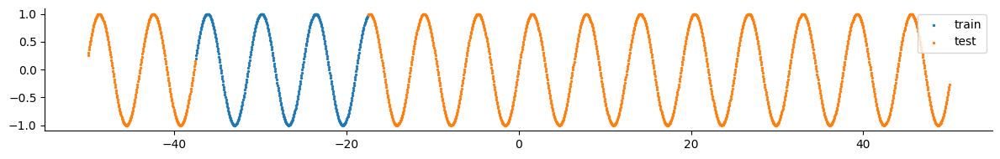

In [29]:
x_train, y_train, x_test, y_test = gen_data(L=2000, prop_train=0.2, start=-50, end=50, reverse=False)

fig, axs = plt.subplots(1, 1, figsize=(12, 2))
plt.scatter(x_train, y_train, label='train', s=2)
plt.scatter(x_test, y_test, label='test', s=2)
plt.legend()
plt.tight_layout()
axs.spines[['right', 'top']].set_visible(False)

We show an animation below of the neural network parameters and the evolution of how it fits the data over its training (epochs).

In these experiments, we used
* Xavier Normal initialization
* Two hidden layers
* 512 neurons per hidden layer
* learning rate = 0.0001
* a = 30 for the activation functions

In [35]:
count_nodes = 256
lr = 0.0001
batch_size = len(x_train) - 1

frames = 50
epochs_per_frame = 200

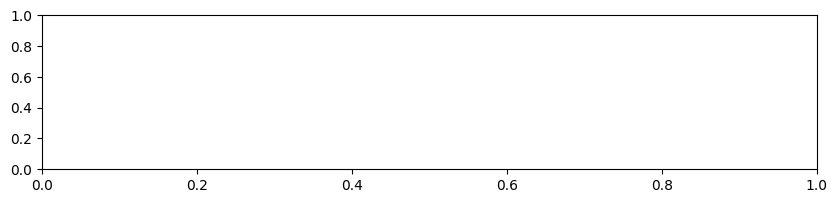

In [36]:
# for animation
fig, axs = plt.subplots(1, 1, figsize=(10, 2)) # dpi=200)

In [38]:
snake_a = 30

model = MLP(count_nodes, snake_a=snake_a)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig,
                               animate,
                               frames=frames,
                               interval=1)
HTML(anim.to_jshtml(fps=10))

## Interpolation Experiment

Now what if we make this an interpolation problem instead of an extrapolation problem. In other words, what if we reverse the train and test set? Will the model be able to infer the sine wave in between the test data? We show below the sine wave colored by train (blue) and test (orange)

Note that we use the term "interpolate" loosely here. This is technically still an extrapolation problem since the distribution of the test set is not within the support of the distribution of the training set.

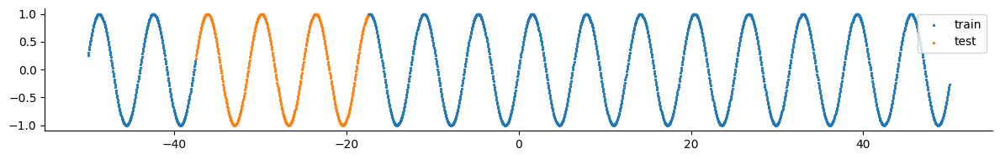

In [46]:
x_train, y_train, x_test, y_test = gen_data(L=2000, prop_train=0.2, start=-50, end=50, reverse=True)

fig, axs = plt.subplots(1, 1, figsize=(12, 2))
plt.scatter(x_train, y_train, label='train', s=2)
plt.scatter(x_test, y_test, label='test', s=2)
plt.legend()
plt.tight_layout()
axs.spines[['right', 'top']].set_visible(False)

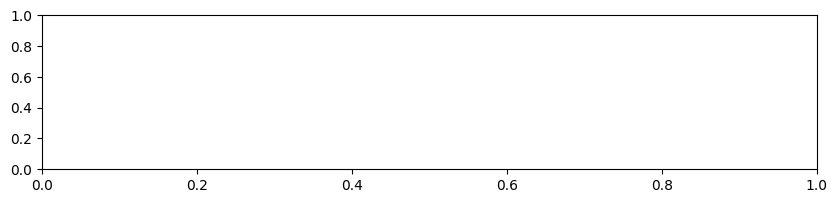

In [47]:
# for animation
fig, axs = plt.subplots(1, 1, figsize=(10, 2)) # dpi=200)

In [48]:
snake_a = 30

model = MLP(count_nodes, snake_a=snake_a)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig,
                               animate,
                               frames=frames,
                               interval=1)
HTML(anim.to_jshtml(fps=10))

## Extrapolation investigation

In [49]:
def gen_data2(L=1000, prop_train=0.5, start=-30*torch.pi, end=30*torch.pi, reverse=False):

    x = torch.linspace(start, end, L)
    y = torch.sin(x) # + torch.sin(x/3) + torch.sin(x*3)

    cnt_train = int(L * prop_train)

    train_inds = [(L//8, (L//8 + cnt_train//2)), (L//8 + cnt_train//2 + L//8, L//8 + cnt_train//2 + L//8 + cnt_train//2)]
    train_inds = (list(np.arange(train_inds[0][0], train_inds[0][1], 1)) 
                  + list(np.arange(train_inds[1][0], train_inds[1][1], 1)))
    
    test_inds = [i for i in np.arange(L) if i not in train_inds]

    x_train = x[train_inds]
    y_train = y[train_inds]

    x_test = x[test_inds]
    y_test = y[test_inds]

    if reverse: # reverse train and test
        return x_test, y_test, x_train, y_train
    else:
        return x_train, y_train, x_test, y_test

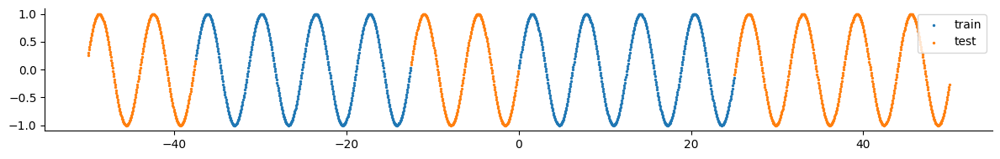

In [50]:
x_train, y_train, x_test, y_test = gen_data2(L=2000, prop_train=0.5, start=-50, end=50, reverse=False)

fig, axs = plt.subplots(1, 1, figsize=(12, 2))
plt.scatter(x_train, y_train, label='train', s=2)
plt.scatter(x_test, y_test, label='test', s=2)
plt.legend()
plt.tight_layout()
axs.spines[['right', 'top']].set_visible(False)

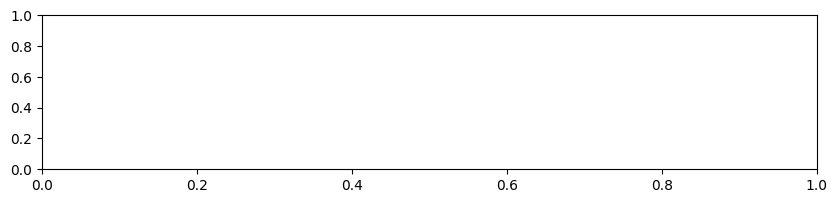

In [51]:
# for animation
fig, axs = plt.subplots(1, 1, figsize=(10, 2)) # dpi=200)

In [52]:
snake_a = 30

model = MLP(count_nodes, snake_a=snake_a)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig,
                               animate,
                               frames=frames,
                               interval=1)
HTML(anim.to_jshtml(fps=10))

## Fitting on a Decaying Signal

In [53]:
def gen_data_decaying(L=1000, prop_train=0.5, start=-30*torch.pi, end=30*torch.pi, reverse=False):

    x = torch.linspace(start, end, L)
    y = torch.sin(x)

    lamb = 0.03
    y_decay = np.exp(-lamb * x) / 10
    y = y * y_decay

    cnt_train = int(L * prop_train)
    cnt_test = L - cnt_train

    x_train = x[:cnt_train]
    y_train = y[:cnt_train]

    x_test = x[cnt_train:]
    y_test = y[cnt_train:]

    if reverse: # reverse train and test
        return x_test, y_test, x_train, y_train
    else:
        return x_train, y_train, x_test, y_test

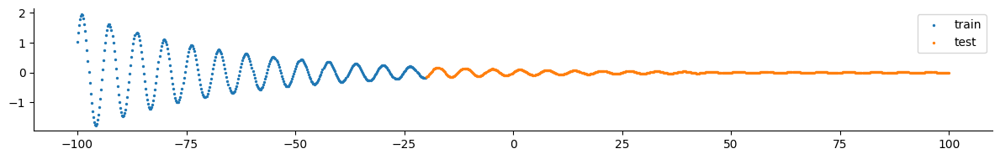

In [57]:
x_train, y_train, x_test, y_test = gen_data_decaying(L=1000, prop_train=0.4, start=-100, end=100, reverse=False)

fig, axs = plt.subplots(1, 1, figsize=(12, 2))
plt.scatter(x_train, y_train, label='train', s=2)
plt.scatter(x_test, y_test, label='test', s=2)
plt.legend()
plt.tight_layout()
axs.spines[['right', 'top']].set_visible(False)

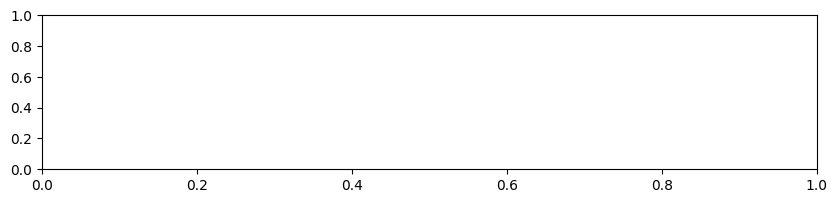

In [58]:
# for animation
fig, axs = plt.subplots(1, 1, figsize=(10, 2)) # dpi=200)

In [60]:
snake_a = 30
batch_size = len(x_train) - 1

model = MLP(count_nodes, snake_a=snake_a)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig,
                               animate,
                               frames=frames,
                               interval=1)
HTML(anim.to_jshtml(fps=10))

## Different coefficients 1 / b sin( a x)

## TSNE on learned features

## Take-aways

We performed...